# Linear Regression Live Demo

Notebook ini dibuat untuk mahasiswa agar dapat memahami:

1. hubungan antara data titik dan garis regresi
2. konsep **error / residual**
3. **Sum of Squared Errors (SSE)**
4. bagaimana garis bergerak menuju solusi yang lebih baik
5. bagaimana parameter **slope (`a`)** dan **intercept (`b`)** memengaruhi garis

> Catatan: notebook ini menggunakan contoh sederhana dan visual agar mudah dijelaskan.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from ipywidgets import interact, FloatSlider

# Clean classroom-friendly defaults
plt.rcParams["figure.figsize"] = (10, 6)
plt.rcParams["font.size"] = 14
np.random.seed(42)

## 1. Sample data

Kita bisa mengganti data ini dengan data sendiri. Pada notebook ini, data sintetis seperti ini cocok karena pola linearnya terlihat jelas.

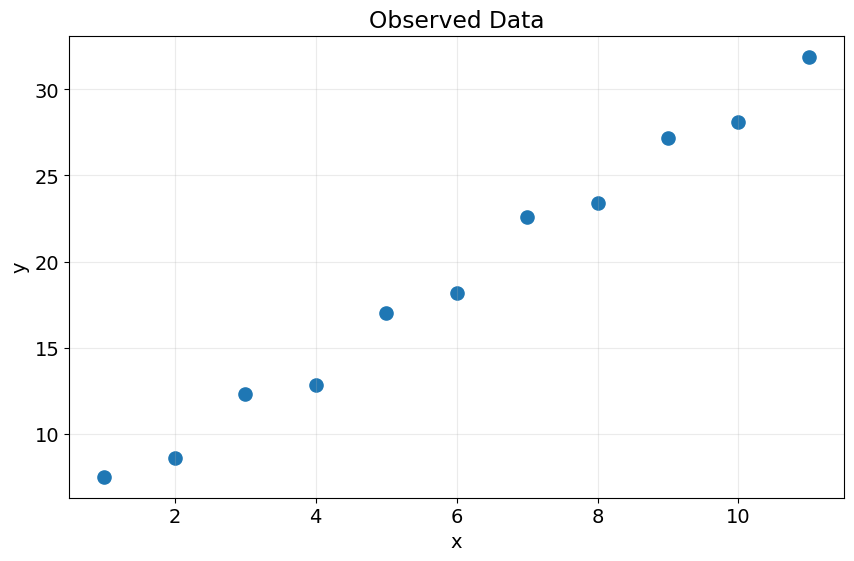

In [2]:
x = np.array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], dtype=float)
noise = np.array([1.0, -0.4, 0.8, -1.2, 0.5, -0.8, 1.1, -0.6, 0.7, -0.9, 0.4])
y = 2.5 * x + 4 + noise

plt.scatter(x, y, s=90)
plt.title("Observed Data")
plt.xlabel("x")
plt.ylabel("y")
plt.grid(alpha=0.25)
plt.show()

## 2. Core functions

- **Prediction:** $\hat{y} = ax + b$
- **Sum of Squared Errors (SSE):** $\mathrm{SSE} = \sum_{i=1}^{n} (\hat{y}_i - y_i)^2$

In [3]:
def predict(x, a, b):
    return a * x + b

def sse(x, y, a, b):
    y_hat = predict(x, a, b)
    return np.sum((y_hat - y) ** 2)

## 3. Interactive line demo

In [9]:
def plot_line(a=1.0, b=0.0):
    y_hat = predict(x, a, b)
    current_sse = sse(x, y, a, b)
    
    # Calculate best-fit line to compare
    n = len(x)
    a_best = (n * np.sum(x * y) - np.sum(x) * np.sum(y)) / (n * np.sum(x**2) - (np.sum(x))**2)
    b_best = np.mean(y) - a_best * np.mean(x)
    best_sse = sse(x, y, a_best, b_best)

    plt.figure(figsize=(11, 7))
    
    # Plot actual data
    plt.scatter(x, y, s=100, label="Data aktual", color="black", zorder=3)
    
    # Plot prediction line dengan warna yang menonjol
    plt.plot(x, y_hat, linewidth=3, color="red", label=f"Garis: y = {a:.2f}x + {b:.2f}", zorder=2)

    # Residual lines dengan warna berdasarkan error direction
    for xi, yi, yhi in zip(x, y, y_hat):
        error = yhi - yi
        color = "blue" if error > 0 else "orange"  # biru: prediction > actual, orange: sebaliknya
        plt.plot([xi, xi], [yi, yhi], linestyle="--", linewidth=1.5, color=color, alpha=0.7, zorder=1)

    # Informasi visual SSE dengan komparasi
    sse_ratio = current_sse / best_sse if best_sse > 0 else float('inf')
    fit_status = "✓ Sempurna!" if sse_ratio < 1.05 else f"({sse_ratio:.1f}x optimal)" if sse_ratio > 2 else "Bagus"
    
    plt.title(f"Interactive Regression Line | SSE = {current_sse:.2f} {fit_status}\n" + 
              f'Slope (a) = {a:.2f} | Intercept (b) = {b:.2f}', 
              fontsize=14, fontweight='bold')
    plt.xlabel("x", fontsize=12)
    plt.ylabel("y", fontsize=12)
    
    # Custom legend
    plt.plot([], [], 'o-', color="black", markersize=8, label="Data aktual")
    plt.plot([], [], '-', color="red", linewidth=3, label=f"Garis {a:.2f}x + {b:.2f}")
    plt.plot([], [], '--', color="blue", linewidth=1.5, label="Error (prediksi > data)")
    plt.plot([], [], '--', color="orange", linewidth=1.5, label="Error (prediksi < data)")
    
    plt.legend(loc="upper left", fontsize=11)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

interact(
    plot_line,
    a=FloatSlider(value=1.0, min=-1.0, max=5.0, step=0.1, description="slope (a)"),
    b=FloatSlider(value=0.0, min=-5.0, max=15.0, step=0.1, description="intercept (b)")
);

interactive(children=(FloatSlider(value=1.0, description='slope (a)', max=5.0, min=-1.0), FloatSlider(value=0.…

## 4. Analisis Garis yang Paling Fit

Persamaan regresi linear sederhana:

$$
a = \frac{n\sum x_i y_i - (\sum x_i)(\sum y_i)}{n\sum x_i^2 - (\sum x_i)^2}
$$

$$
b = \bar{y} - a\bar{x}
$$

In [5]:
n = len(x)
a_best = (n * np.sum(x * y) - np.sum(x) * np.sum(y)) / (n * np.sum(x**2) - (np.sum(x))**2)
b_best = np.mean(y) - a_best * np.mean(x)

print(f"Best slope (a)     : {a_best:.4f}")
print(f"Best intercept (b) : {b_best:.4f}")
print(f"SSE                : {sse(x, y, a_best, b_best):.4f}")

Best slope (a)     : 2.4682
Best intercept (b) : 4.2455
SSE                : 7.0159


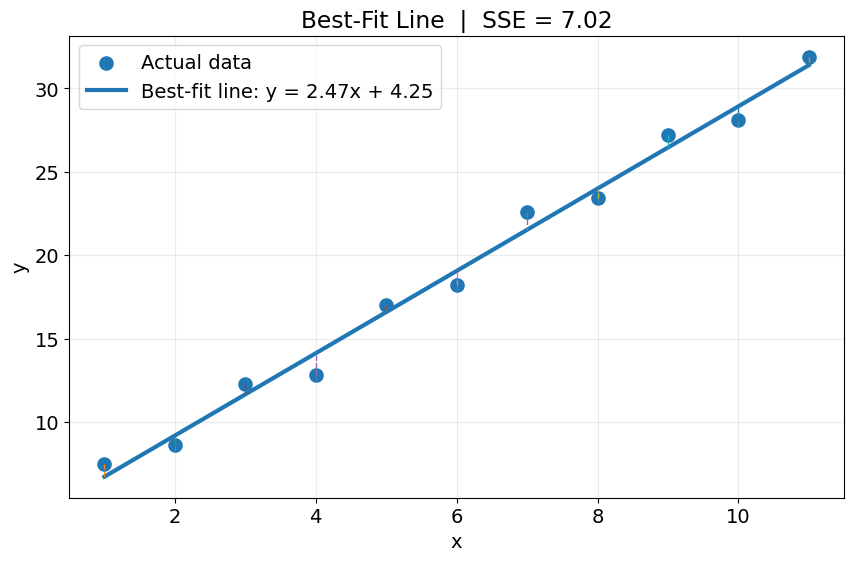

In [6]:
y_best = predict(x, a_best, b_best)

plt.figure(figsize=(10, 6))
plt.scatter(x, y, s=90, label="Actual data")
plt.plot(x, y_best, linewidth=3, label=f"Best-fit line: y = {a_best:.2f}x + {b_best:.2f}")

for xi, yi, yhi in zip(x, y, y_best):
    plt.plot([xi, xi], [yi, yhi], linestyle="--", linewidth=1)

plt.title(f"Best-Fit Line  |  SSE = {sse(x, y, a_best, b_best):.2f}")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.grid(alpha=0.25)
plt.show()

## 5. Animation: Garis bergerak menuju solusi yang lebih baik

In [7]:
a_start, b_start = -0.5, 12.0
frames = 60
a_values = np.linspace(a_start, a_best, frames)
b_values = np.linspace(b_start, b_best, frames)

fig, ax = plt.subplots(figsize=(10, 6))
ax.scatter(x, y, s=90, label="Actual data")
line, = ax.plot([], [], linewidth=3, label="Moving line")
title = ax.set_title("")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.grid(alpha=0.25)
ax.legend()

def init():
    line.set_data([], [])
    title.set_text("Starting point")
    return line, title

def update(frame):
    a = a_values[frame]
    b = b_values[frame]
    y_hat = predict(x, a, b)
    line.set_data(x, y_hat)
    title.set_text(f"Frame {frame+1}/{frames}  |  a={a:.2f}, b={b:.2f}, SSE={sse(x, y, a, b):.2f}")
    return line, title

anim = FuncAnimation(fig, update, frames=frames, init_func=init, interval=180, blit=False)
plt.close(fig)
HTML(anim.to_jshtml())

## 6. Optional: Animasi Gradient Descent

In [8]:
def gradients(x, y, a, b):
    y_hat = predict(x, a, b)
    error = y_hat - y
    da = 2 * np.sum(error * x)
    db = 2 * np.sum(error)
    return da, db

a_gd, b_gd = -0.5, 12.0
lr = 0.001
history = []

for _ in range(120):
    history.append((a_gd, b_gd, sse(x, y, a_gd, b_gd)))
    da, db = gradients(x, y, a_gd, b_gd)
    a_gd -= lr * da
    b_gd -= lr * db

fig, ax = plt.subplots(figsize=(10, 6))
ax.scatter(x, y, s=90, label="Actual data")
line, = ax.plot([], [], linewidth=3, label="Gradient descent line")
title = ax.set_title("")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.grid(alpha=0.25)
ax.legend()

def init_gd():
    line.set_data([], [])
    title.set_text("Gradient descent starts")
    return line, title

def update_gd(frame):
    a, b, current_sse = history[frame]
    y_hat = predict(x, a, b)
    line.set_data(x, y_hat)
    title.set_text(f"Step {frame+1}/{len(history)}  |  a={a:.2f}, b={b:.2f}, SSE={current_sse:.2f}")
    return line, title

anim_gd = FuncAnimation(fig, update_gd, frames=len(history), init_func=init_gd, interval=120, blit=False)
plt.close(fig)
HTML(anim_gd.to_jshtml())

## 7. Diskusi

- Mengapa error dikuadratkan, bukan dijumlahkan biasa?
- Apa pengaruh slope dan intercept terhadap bentuk garis?
- Mengapa garis terbaik bukan berarti melewati semua titik?
- Kapan pendekatan linear seperti ini mungkin tidak cukup?